# Find rain days in a specified region, given 8 upper atm variables and respective Gridmet data.

This notebook calculates average rain on a 128x128 grid, it then averages the respective 8 upper atm variables. 

* this version loads netcdf files directly via xarray
* "Gridmet data" can now be replaced with any model's output

### TODO items

* better graphs (i.e. include lat/lon scale)



In [1]:
from IPython import display
import numpy as np

#from skimage.metrics import structural_similarity as ssim
import copy


In [2]:
# load netcdf files directly via xarray
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy

# Configuration

In [3]:
# Ordering: nRow ordering: obs, raw, RegCM4, WRF, MPAS, CNN, SDSM, KDDM, MBCn, LOCA
mpi_sigfiles=['/glade/work/mcginnis/DCA/data/gen/final/gridmet/hist/prec.hist.gridMET.obs.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpi/hist/prec.hist.MPI-ESM-LR.raw.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpi/rcp85/prec.rcp85.MPI-ESM-LR.raw.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/regcm4/hist/prec.hist.MPI-ESM-LR.RegCM4.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/regcm4/rcp85/prec.rcp85.MPI-ESM-LR.RegCM4.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/wrf/hist/prec.hist.MPI-ESM-LR.WRF.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/wrf/rcp85/prec.rcp85.MPI-ESM-LR.WRF.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpas/hist/prec.hist.MPI-ESM-LR.MPAS.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mpas/rcp85/prec.rcp85.MPI-ESM-LR.MPAS.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/cnn/hist/prec.hist.MPI-ESM-LR.CNN.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/cnn/rcp85/prec.rcp85.MPI-ESM-LR.CNN.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/sdsm/hist/prec.hist.MPI-ESM-LR.SDSM.day.1976-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/sdsm/rcp85/prec.rcp85.MPI-ESM-LR.SDSM.day.2070-2099.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/kddm/hist/prec.hist.MPI-ESM-LR.KDDM.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/kddm/rcp85/prec.rcp85.MPI-ESM-LR.KDDM.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mbcn/hist/prec.hist.MPI-ESM-LR.MBCn.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/mbcn/rcp85/prec.rcp85.MPI-ESM-LR.MBCn.day.2075-2100.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/loca/hist/prec.hist.MPI-ESM-LR.LOCA.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
'/glade/work/mcginnis/DCA/data/gen/final/loca/rcp85/prec.rcp85.MPI-ESM-LR.LOCA.day.2075-2100.NAM-22i.SGP.x098.y36.nc']

# Compact configuration

In [4]:
sigdir = '/glade/work/mcginnis/DCA/data/gen/final'
def model2absfilepath(mn, exp, x, y):
    if mn == 'obs' or mn == 'gridMET':
        mn = 'gridMET'
        filename = 'prec.{}.gridMET.{}.day.1980-2005.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, 'obs', x, y)
    elif mn == 'raw' or mn == 'mpi':
        mn = 'mpi'
        if exp == 'hist':
            filename = 'prec.{}.MPI-ESM-LR.{}.day.1980-2005.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, 'raw', x, y)
        elif exp == 'rcp85':
            filename = 'prec.{}.MPI-ESM-LR.{}.day.2075-2100.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, 'raw', x, y)
        else: print("Unknown experiment!")
    elif mn == 'SDSM':  # starts at 1976
        if exp == 'hist':
            filename = 'prec.{}.MPI-ESM-LR.{}.day.1976-2005.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, mn, x, y)
        elif exp == 'rcp85':
            filename = 'prec.{}.MPI-ESM-LR.{}.day.2070-2099.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, mn, x, y)
        else: print("Unknown experiment!")

    elif exp == 'hist':
        filename = 'prec.{}.MPI-ESM-LR.{}.day.1980-2005.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, mn, x, y)
    elif exp == 'rcp85':
        filename = 'prec.{}.MPI-ESM-LR.{}.day.2075-2100.NAM-22i.SGP.x0{}.y{}.nc'.format(exp, mn, x, y)
    else: print("Unknown experiment!")
    return sigdir + '/' + mn.lower() + '/' + exp + '/' + filename
    

In [5]:
# test single file
model2absfilepath('RegCM4', 'rcp85', 98, 36)

'/glade/work/mcginnis/DCA/data/gen/final/regcm4/rcp85/prec.rcp85.MPI-ESM-LR.RegCM4.day.2075-2100.NAM-22i.SGP.x098.y36.nc'

In [6]:
# create list of abs filepaths
[model2absfilepath(ff, 'hist', 98, 36) for ff in ['obs','raw','RegCM4','WRF','MPAS','CNN','SDSM','KDDM','MBCn','LOCA']]


['/glade/work/mcginnis/DCA/data/gen/final/gridmet/hist/prec.hist.gridMET.obs.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/mpi/hist/prec.hist.MPI-ESM-LR.raw.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/regcm4/hist/prec.hist.MPI-ESM-LR.RegCM4.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/wrf/hist/prec.hist.MPI-ESM-LR.WRF.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/mpas/hist/prec.hist.MPI-ESM-LR.MPAS.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/cnn/hist/prec.hist.MPI-ESM-LR.CNN.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/sdsm/hist/prec.hist.MPI-ESM-LR.SDSM.day.1976-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/kddm/hist/prec.hist.MPI-ESM-LR.KDDM.day.1980-2005.NAM-22i.SGP.x098.y36.nc',
 '/glade/work/mcginnis/DCA/data/gen/final/mbcn/hist/prec.hi

### Load model output data

In [7]:
##################
## LOAD GRIDMET ##
##################
# 1980-1989
istart = 365
#ndays = 3653  # 1980-1989
ndays = 13515 # 1980-2016 

dv1 = xr.open_dataset('/glade/work/dkorytin/srgan_data/prec128_gridmetA_1979-2016.nc')['prec'][istart:istart+ndays]
# dv2 = xr.open_dataset('/glade/work/dkorytin/srgan_data/tmax128_gridmetA_1979-2016.nc')['tmax'][istart:istart+ndays]
# dv3 = xr.open_dataset('/glade/work/dkorytin/srgan_data/tmin128_gridmetA_1979-2016.nc')['tmin'][istart:istart+ndays]
# dv4 = xr.open_dataset('/glade/work/dkorytin/srgan_data/uas128_gridmetA_1979-2016.nc')['uas'][istart:istart+ndays]
# dv5 = xr.open_dataset('/glade/work/dkorytin/srgan_data/vas128_gridmetA_1979-2016.nc')['vas'][istart:istart+ndays]
# dv6 = xr.open_dataset('/glade/work/dkorytin/srgan_data/huss128_gridmetA_1979-2016.nc')['huss'][istart:istart+ndays]
# dv7 = xr.open_dataset('/glade/work/dkorytin/srgan_data/rsds128_gridmetA_1979-2016.nc')['rsds'][istart:istart+ndays]
# dv8 = xr.open_dataset('/glade/work/dkorytin/srgan_data/miss128_gridmetB_1979-2016.nc')['miss'][istart:istart+ndays]




### Load UATM data

In [8]:
###########################
## LOAD ERAI data: daily ##
###########################
def load_uatm_erai():
    global mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mnvars
    
    # load eraionmpi
    #mndays = 11688      # 1979-2010
    mstart = 365
    mndays = 13515       # 1980-2016 
    mnvars = 8*1
    mdv1 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/U850.ERAI.MPIGRID.1979-2018.nc')['U'][mstart:mstart+mndays*1]
    mdv2 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/V850.ERAI.MPIGRID.1979-2018.nc')['V'][mstart:mstart+mndays*1]
    mdv3 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Q850.ERAI.MPIGRID.1979-2018.nc')['Q'][mstart:mstart+mndays*1]
    mdv4 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/T700.ERAI.MPIGRID.1979-2018.nc')['T'][mstart:mstart+mndays*1]
    mdv5 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Z700.ERAI.MPIGRID.1979-2018.nc')['Z'][mstart:mstart+mndays*1]
    mdv6 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/Z500.ERAI.MPIGRID.1979-2018.nc')['Z'][mstart:mstart+mndays*1]
    mdv7 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/U250.ERAI.MPIGRID.1979-2018.nc')['U'][mstart:mstart+mndays*1]
    mdv8 = xr.open_dataset('/glade/scratch/dkorytin/erai-on-mpigrid/V250.ERAI.MPIGRID.1979-2018.nc')['V'][mstart:mstart+mndays*1]

    print("Days loaded", len(mdv7))



In [9]:
###################
## LOAD MPI      ##
###################  
def load_uatm_mpi_hist():
    global mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mnvars
    
    mnvars = 8
    
    d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/historical/'

    mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv2 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv3 = xr.open_dataset(d+'Q_MPI-ESM-LR_historical_r1i1p1_NAmerica_p850_19500101-20051231_dayavg_mpigrid.nc')['Q'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv4 = xr.open_dataset(d+'T_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['T'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv5 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p700_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv6 = xr.open_dataset(d+'Z_MPI-ESM-LR_historical_r1i1p1_NAmerica_p500_19500101-20051231_dayavg_mpigrid.nc')['Z'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv7 = xr.open_dataset(d+'U_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['U'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv8 = xr.open_dataset(d+'V_MPI-ESM-LR_historical_r1i1p1_NAmerica_p250_19500101-20051231_dayavg_mpigrid.nc')['V'].sel(time=slice('1976-01-01T00:00:00', '2006-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))

def load_uatm_mpi_future():
    global mdv1,mdv2,mdv3,mdv4,mdv5,mdv6,mdv7,mdv8,mnvars
    
    d='/glade/p/ral/risc/rmccrary/CMIP5_CORDEX/NAmerica/MPI-ESM-LR/native/rcp85/'

    mnvars = 8
    mdv1 = xr.open_dataset(d+'U_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['U'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv2 = xr.open_dataset(d+'V_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['V'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv3 = xr.open_dataset(d+'Q_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p850_20060101-21001231_dayavg_mpigrid.nc')['Q'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv4 = xr.open_dataset(d+'T_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p700_20060101-21001231_dayavg_mpigrid.nc')['T'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv5 = xr.open_dataset(d+'Z_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p700_20060101-21001231_dayavg_mpigrid.nc')['Z'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv6 = xr.open_dataset(d+'Z_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p500_20060101-21001231_dayavg_mpigrid.nc')['Z'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv7 = xr.open_dataset(d+'U_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p250_20060101-21001231_dayavg_mpigrid.nc')['U'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))
    mdv8 = xr.open_dataset(d+'V_MPI-ESM-LR_rcp85_r1i1p1_NAmerica_p250_20060101-21001231_dayavg_mpigrid.nc')['V'].sel(time=slice('2006-01-01T00:00:00', '2101-01-01T00:00:00'), lat=slice(23,56), lon=slice(-113,-80))

#load_uatm_mpi_future()


# Averaging code

In [10]:
###################
## UATM averages ##
###################

def calc_uatm_average(mpr_min, mpr_max, rainsignal, ymin, ymax):
    # global inputs: dv[1-8], mdv[1-8], mnvars
    mnvars = 8
    
    # initialize accumulators
    indices = []
    distribution = []
    raw_ires = len(mdv1[0])
    raininput = np.zeros((mnvars, raw_ires, raw_ires))
    raincount = 0
    
    for ii in range(0,len(rainsignal)):
        mpr = rainsignal[ii]
            
        # May = 5
        if mpr["time.month"] == 5 and mpr["time.year"] >= ymin and mpr["time.year"] < ymax:    



            if mpr >= mpr_min and mpr < mpr_max:
                distribution.append(mpr)
                indices.append(ii)

                #mpr = dv1[ii].sel(lat=slice(32.125,38.125), lon=slice(-101.875,-93.875)).mean()

                # find matching input sample 
                #ot= dv1[ii-1]['time']
                ot = str(np.array(mpr['time']))

                mdv1.sel(time=ot,method='nearest')
                isample = [mdv1.sel(time=ot,method='nearest'),mdv2.sel(time=ot,method='nearest'),mdv3.sel(time=ot,method='nearest'),mdv4.sel(time=ot,method='nearest'),mdv5.sel(time=ot,method='nearest'),mdv6.sel(time=ot,method='nearest'),mdv7.sel(time=ot,method='nearest'),mdv8.sel(time=ot,method='nearest')]
                #ot= dv1[ii]['time']
                #assert ot["time.day"]==isample[0]['time.day'], "Days are not equal"
                isample = np.array(isample)

                raininput += isample
                raincount += 1
            
    raininput /= raincount
    #print("days:", raincount)
    
    return raininput, raincount, distribution, indices
    

# Plot routines

In [44]:
# POSTAGE STAMP LAYOUT
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import cartopy.feature as cfeature

from os.path import basename
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.ticker as ticker
from matplotlib import ticker

import warnings
warnings.filterwarnings("ignore")

   

def plot_abs_postage(sigfiles, vmin, vmax, mpr_min, mpr_max, title):     
    varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']

    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))
    
    # Q850 cubehelix_r, 0:maximum
    vmin[2] = 0
    
    # U250 brg, 0:max
    vmin[6] = 0
    
    # V250 PuOr, symmetric around zero
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))

    
    #fig, axarr = plt.subplots(nrows=3, ncols=8, figsize = (10,10*(3/8.+0.0)), gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1,1,1.3]})
    fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=8, figsize = (20,20*(len(sigfiles)/8.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    lon = mdv1[0].lon
    lat = mdv1[0].lat

    # counts
    counts = [0]*len(sigfiles)
    
    # plots 
    #for sigfile in sigfiles:
    #for jj, mpr_min, mpr_max, label in [[0, 0., 0.254, 'Dry'], [1, 0.254, 3., 'Moist'], [2, 3., 9999., 'Wet']]:
    #mpr_min, mpr_max = [0., 0.254]
    for jj in range(len(sigfiles)):
        
        sigfile = sigfiles[jj]
        
        # load UATM and signal file contents
        if sigfile.lower().find('hist') >= 0: 
            load_uatm_mpi_hist()
        elif sigfile.lower().find('rcp85') >= 0: 
            load_uatm_mpi_future()
        else:
            print ("ERROR: neither hist or rcp85 found")
        rainsignal = xr.open_dataset(sigfile)['prec']

        # row label
        sigfilename = basename(sigfile)
        #print ("days:", count, ", model:", sigfilename)
        label = ' '.join(sigfile.split('.')[3:4])
        
        # calc avg atm for criteria            
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
            
        # use percentages intead of counts (2021-10-26)
        #counts[jj] = count
        allavginput, allcount, alldistribution, allindices = calc_uatm_average(0, 9999, rainsignal, -9999, 9999) 
        counts[jj] = count/allcount


        for ii in range(8):
            axarr[jj,ii].coastlines()
            axarr[jj,ii].add_feature(cfeature.STATES)
            img_extent = (lon.min(), lon.max(), lat.min(), lat.max())

            #plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
            plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  

            # show y tics on first column
            if ii==0:
                axarr[jj,ii].get_yaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize='xx-small')

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                # lat range: 56 to 23
                labels = [item.get_text() for item in axarr[jj,ii].get_yticklabels()]
                #labels = ['56','46','36','26']
                axarr[jj,ii].set_yticklabels(labels)

            ## show y labels on last column
            #if ii==7:
                ##axarr[jj,ii].get_yaxis().set_visible(True)
                ##axarr[jj,ii].tick_params(labelsize='xx-small')
                #
                #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.03, pad=0.2)
                #
                #
                ##ax.set_ylabel("Label", rotation=270)
                #
                ##cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="vertical", fraction=0.046, pad=0.016)
                #cbar.set_label('dry', rotation=90, size='xx-small')
                #cbar.ax.tick_params(labelsize='xx-small')


            if ii>=1:
                axarr[jj,ii].get_yaxis().set_visible(False)
                axarr[jj,ii].tick_params(labelsize='xx-small')



            if jj == 0:
                axarr[jj,ii].set_title(varnames[ii])
                axarr[jj,ii].get_xaxis().set_visible(False)
                axarr[jj,ii].tick_params(labelsize='xx-small')

            if jj==1:
                axarr[jj,ii].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

            # show custom tics on bottom row: lon=slice(-113,-80)
            if jj==len(sigfiles)-1:
                axarr[jj,ii].get_xaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize='xx-small')

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                labels = [item.get_text() for item in axarr[jj,ii].get_xticklabels()]
                #labels[1] = '-113'
                #labels[2] = '-103'
                #labels[3] = '-93'
                ##labels[4] = '-83'
                axarr[jj,ii].set_xticklabels(labels)




            # colorbar only on last postage stamp
            if jj==len(sigfiles)-1:
                # use scientific notation on 3rd column colorbar only
                if ii == 2:     
                    def fmt(x, pos):
                        a, b = '{:.1e}'.format(x).split('e')
                        b = int(b)
                        return r'${}e{}$'.format(a, b)
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))
                    #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format='%.0e') #format=ticker.FuncFormatter(fmt))
                    #cbar.set_ticks([0.2, 0.4, 0.6, 0.8])
                    #cbar.set_ticklabels(["A", "B", "C", "D"])
                    tick_locator = ticker.MaxNLocator(nbins=4)
                    cbar.locator = tick_locator
                    cbar.update_ticks()
                else:
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=None)                    

                cbar.set_label(units[ii], size='xx-small')
                cbar.ax.tick_params(labelsize='xx-small')
                    
            # row titles
            nrows = len(sigfiles)
            #plt.figtext(0.09, 1-(1.4/nrows)-jj*(.73/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, weight='normal', rotation=90)
            plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+' %', fontsize=11, weight='normal', rotation=90)


#         # row title
#         sigfilename = basename(sigfile)
#         #print ("days:", count, ", model:", sigfilename)
#         rowtitle = ' '.join(sigfilename.split('.')[0:4]) # + ' Count: '+str(counts)

        # title
        #fig.suptitle(title, y=1.05, fontsize=14)
        #fig.suptitle(title, y=1-(.5/nrows), fontsize=14, fontweight="bold")
        fig.suptitle(title, y=0.92, fontsize=14)

        
        #plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0.0, hspace=0, right=0.7)

    plt.show()
        


In [12]:
def plot_abs_postage2(sigfiles, vmin, vmax, mpr_min, mpr_max, title):     
    varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']

    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))
    
    # Q850 cubehelix_r, 0:maximum
    vmin[2] = 0
    
    # U250 brg, 0:max
    vmin[6] = 0
    
    # V250 PuOr, symmetric around zero
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))

    
    #fig, axarr = plt.subplots(nrows=3, ncols=8, figsize = (10,10*(3/8.+0.0)), gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1,1,1.3]})
    #fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=8, figsize = (20,20*(len(sigfiles)/8.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=2, figsize = (10,10*(len(sigfiles)/2.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})

    #lon = mdv1[0].lon
    #lat = mdv1[0].lat
    lon = dv1[0].lon
    lat = dv1[0].lat


    # counts
    counts = [0]*len(sigfiles)
    
    # plots 
    #for sigfile in sigfiles:
    #for jj, mpr_min, mpr_max, label in [[0, 0., 0.254, 'Dry'], [1, 0.254, 3., 'Moist'], [2, 3., 9999., 'Wet']]:
    #mpr_min, mpr_max = [0., 0.254]
    for jj in range(len(sigfiles)):
        
        sigfile = sigfiles[jj]
        
        # load UATM and signal file contents
        if sigfile.lower().find('hist') >= 0: 
            load_uatm_mpi_hist()
        elif sigfile.lower().find('rcp85') >= 0: 
            load_uatm_mpi_future()
        else:
            print ("ERROR: neither hist or rcp85 found")
        rainsignal = xr.open_dataset(sigfile)['prec']

        # row label
        sigfilename = basename(sigfile)
        #print ("days:", count, ", model:", sigfilename)
        label = ' '.join(sigfile.split('.')[3:4])
        
        # calc avg atm for criteria            
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
            
        # use percentages intead of counts (2021-10-26)
        #counts[jj] = count
        allavginput, allcount, alldistribution, allindices = calc_uatm_average(0, 9999, rainsignal, -9999, 9999) 
        counts[jj] = count/allcount


        #for ii in range(8):
        for iii,ii in [(2,0), (4,1)]:
        #for iii,ii in [(0,0), (1,1), (2,2), (3,3), (4,4), (5,5), (6,6), (7,7)]:

            axarr[jj,ii].coastlines()
            axarr[jj,ii].add_feature(cfeature.STATES)
            img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
            
            # add wind barbs
            if iii == 2:
                x=[]; y=[]; u=[]; v=[]
                for mm in range(0, 18, 2):
                    hx = []
                    for nn in range(0, 18, 2): 
                        x.append(mdv1[0][mm,nn].lon)
                        y.append(mdv1[0][mm,nn].lat)
                        #u.append(isample[11][mm,nn]) # uas
                        #v.append(isample[12][mm,nn]) # vas
                        u.append(avginput[0][mm,nn]*1.94384) # u850 in knots
                        v.append(avginput[1][mm,nn]*1.94384) # v850 in knots
                axarr[jj,ii].barbs(x, y, u, v, length=6, sizes=dict(emptybarb=0.25, spacing=0.2, height=0.5), linewidth=1.2)

            
            # add huss850 contours
            x=[]; y=[];
            for mm in range(0, 18, 1):
                x.append(mdv1[0][mm,mm].lon)
                y.append(mdv1[0][mm,mm].lat)
            hx=[]; hy=[]
            if iii ==2: # 1000x huss from kg/kg to g/kg
                scale = 1000
            else: 
                scale = 1
            for mm in range(0, 18, 1):
                hx = []
                for nn in range(0, 18, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(avginput[iii][mm,nn]*scale)
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[jj,ii].contour(X, Y, Z)
            axarr[jj,ii].clabel(CS, inline=True, fontsize=10)


            #plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
            plot = axarr[jj,ii].imshow(avginput[iii][::-1,:], vmin=vmin[iii], vmax=vmax[iii], cmap=cmaps[iii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  

            # show y tics on first column
            if ii==0:
                axarr[jj,ii].get_yaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                # lat range: 56 to 23
                labels = [item.get_text() for item in axarr[jj,ii].get_yticklabels()]
                #labels = ['56','46','36','26']
                axarr[jj,ii].set_yticklabels(labels)

            ## show y labels on last column
            #if ii==7:
                ##axarr[jj,ii].get_yaxis().set_visible(True)
                ##axarr[jj,ii].tick_params(labelsize='xx-small')
                #
                #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.03, pad=0.2)
                #
                #
                ##ax.set_ylabel("Label", rotation=270)
                #
                ##cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="vertical", fraction=0.046, pad=0.016)
                #cbar.set_label('dry', rotation=90, size='xx-small')
                #cbar.ax.tick_params(labelsize='xx-small')


            if ii>=1:
                axarr[jj,ii].get_yaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')



            if jj == 0:
                axarr[jj,ii].set_title(varnames[iii])
                axarr[jj,ii].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

            if jj==1:
                axarr[jj,ii].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

            # show custom tics on bottom row: lon=slice(-113,-80)
            if jj==len(sigfiles)-1:
                axarr[jj,ii].get_xaxis().set_visible(True)
                axarr[jj,ii].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                labels = [item.get_text() for item in axarr[jj,ii].get_xticklabels()]
                #labels[1] = '-113'
                #labels[2] = '-103'
                #labels[3] = '-93'
                ##labels[4] = '-83'
                axarr[jj,ii].set_xticklabels(labels)




            # colorbar only on last postage stamp
            if jj==len(sigfiles)-1:
                # use scientific notation on 3rd column colorbar only
                if iii == 2:     
                    def fmt(x, pos):
                        a, b = '{:.1e}'.format(x).split('e')
                        b = int(b)
                        return r'${}e{}$'.format(a, b)
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))
                    #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format='%.0e') #format=ticker.FuncFormatter(fmt))
                    #cbar.set_ticks([0.2, 0.4, 0.6, 0.8])
                    #cbar.set_ticklabels(["A", "B", "C", "D"])
                    tick_locator = ticker.MaxNLocator(nbins=4)
                    cbar.locator = tick_locator
                    cbar.update_ticks()
                else:
                    cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.0385, pad=0.2, format=None)                    

                cbar.set_label(units[iii], size=8)
                cbar.ax.tick_params(labelsize=8)
                    
            # row titles
            nrows = len(sigfiles)
            #plt.figtext(0.09, 1-(1.4/nrows)-jj*(.73/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, weight='normal', rotation=90)
            plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+' %', fontsize=11, weight='normal', rotation=90)


#         # row title
#         sigfilename = basename(sigfile)
#         #print ("days:", count, ", model:", sigfilename)
#         rowtitle = ' '.join(sigfilename.split('.')[0:4]) # + ' Count: '+str(counts)

        # title
        #fig.suptitle(title, y=1.05, fontsize=14)
        #fig.suptitle(title, y=1-(.5/nrows), fontsize=14, fontweight="bold")
        fig.suptitle(title, y=0.9, fontsize=18)

        
        #plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0.0, hspace=0, right=0.7)

    plt.show()

In [13]:
def plot_abs_postage3(sigfiles, vmin, vmax, mpr_min, mpr_max, title):     
    varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']

    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))
    
    # Q850 cubehelix_r, 0:maximum
    vmin[2] = 0
    
    # U250 brg, 0:max
    vmin[6] = 0
    
    # V250 PuOr, symmetric around zero
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))

    
    #fig, axarr = plt.subplots(nrows=3, ncols=8, figsize = (10,10*(3/8.+0.0)), gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1,1,1.3]})
    #fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=8, figsize = (20,20*(len(sigfiles)/8.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    #fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=2, figsize = (10,10*(len(sigfiles)/2.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    fig, axarr = plt.subplots(nrows=2, ncols=8, figsize = (20, 5), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1, 1]})

    
    #lon = mdv1[0].lon
    #lat = mdv1[0].lat
    lon = dv1[0].lon
    lat = dv1[0].lat


    # counts
    counts = [0]*len(sigfiles)
    
    # plots 
    #for sigfile in sigfiles:
    #for jj, mpr_min, mpr_max, label in [[0, 0., 0.254, 'Dry'], [1, 0.254, 3., 'Moist'], [2, 3., 9999., 'Wet']]:
    #mpr_min, mpr_max = [0., 0.254]
    for jj in range(len(sigfiles)):
        
        sigfile = sigfiles[jj]
        
        # load UATM and signal file contents
        if sigfile.lower().find('hist') >= 0: 
            load_uatm_mpi_hist()
        elif sigfile.lower().find('rcp85') >= 0: 
            load_uatm_mpi_future()
        else:
            print ("ERROR: neither hist or rcp85 found")
        rainsignal = xr.open_dataset(sigfile)['prec']

        # row label
        sigfilename = basename(sigfile)
        #print ("days:", count, ", model:", sigfilename)
        label = ' '.join(sigfile.split('.')[3:4])
        
        # calc avg atm for criteria            
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
            
        # use percentages intead of counts (2021-10-26)
        #counts[jj] = count
        allavginput, allcount, alldistribution, allindices = calc_uatm_average(0, 9999, rainsignal, -9999, 9999) 
        counts[jj] = count/allcount


        #for ii in range(8):
        for iii,ii in [(2,0), (4,1)]:
        #for iii,ii in [(0,0), (1,1), (2,2), (3,3), (4,4), (5,5), (6,6), (7,7)]:

            axarr[ii,jj].coastlines()
            axarr[ii,jj].add_feature(cfeature.STATES)
            img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
            
            # add wind barbs
            if iii == 2:
                x=[]; y=[]; u=[]; v=[]
                for mm in range(1, 17, 2):
                    hx = []
                    for nn in range(1, 17, 2): 
                        x.append(mdv1[0][mm,nn].lon)
                        y.append(mdv1[0][mm,nn].lat)
                        #u.append(isample[11][mm,nn]) # uas
                        #v.append(isample[12][mm,nn]) # vas
                        u.append(avginput[0][mm,nn]*1.94384) # u850 in knots
                        v.append(avginput[1][mm,nn]*1.94384) # v850 in knots
                axarr[ii,jj].barbs(x, y, u, v, length=5, sizes=dict(emptybarb=0.25, spacing=0.2, height=0.5), linewidth=0.95)

            
            # add huss850 contours
            x=[]; y=[];
            for mm in range(0, 18, 1):
                x.append(mdv1[0][mm,mm].lon)
                y.append(mdv1[0][mm,mm].lat)
            hx=[]; hy=[]
            if iii ==2: # 1000x huss from kg/kg to g/kg
                scale = 1000
            else: 
                scale = 1
            for mm in range(0, 18, 1):
                hx = []
                for nn in range(0, 18, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(avginput[iii][mm,nn]*scale)
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[ii,jj].contour(X, Y, Z)
            axarr[ii,jj].clabel(CS, inline=True, fontsize=10)


            #plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
            plot = axarr[ii,jj].imshow(avginput[iii][::-1,:], vmin=vmin[iii], vmax=vmax[iii], cmap=cmaps[iii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  

            # show y tics on first column
            if jj==0 or jj==1:
                axarr[ii,jj].get_yaxis().set_visible(True)
                axarr[ii,jj].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                # lat range: 56 to 23
                labels = [item.get_text() for item in axarr[ii,jj].get_yticklabels()]
                #labels = ['56','46','36','26']
                axarr[ii,jj].set_yticklabels(labels)

            ## show y labels on last column
            #if ii==7:
                ##axarr[jj,ii].get_yaxis().set_visible(True)
                ##axarr[jj,ii].tick_params(labelsize='xx-small')
                #
                #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.03, pad=0.2)
                #
                #
                ##ax.set_ylabel("Label", rotation=270)
                #
                ##cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="vertical", fraction=0.046, pad=0.016)
                #cbar.set_label('dry', rotation=90, size='xx-small')
                #cbar.ax.tick_params(labelsize='xx-small')


#             if ii>=1:
#                 axarr[ii,jj].get_yaxis().set_visible(False)
#                 #axarr[jj,ii].tick_params(labelsize='xx-small')



            if ii == 0:
                #axarr[ii,jj].set_title(varnames[iii])
                axarr[ii,jj].set_title(label+': '+str(int(counts[jj]*100))+' %')
                axarr[ii,jj].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

#             if jj==1:
#                 axarr[ii,jj].get_xaxis().set_visible(False)
#                 #axarr[jj,ii].tick_params(labelsize='xx-small')

            # show custom tics on bottom row: lon=slice(-113,-80)
            if ii==1:
                axarr[ii,jj].get_xaxis().set_visible(True)
                axarr[ii,jj].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                labels = [item.get_text() for item in axarr[ii,jj].get_xticklabels()]
                #labels[1] = '-113'
                #labels[2] = '-103'
                #labels[3] = '-93'
                ##labels[4] = '-83'
                axarr[ii,jj].set_xticklabels(labels)




            # colorbar only on last postage stamp
            if jj==len(sigfiles)-1:
                # use scientific notation on 3rd column colorbar only
                if iii == 2:     
                    def fmt(x, pos):
                        a, b = '{:.1e}'.format(x).split('e')
                        b = int(b)
                        return r'${}e{}$'.format(a, b)
                    
#                     fig.subplots_adjust(right=0.8)
#                     cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#                     cbar = fig.colorbar(plot, ax=cbar_ax, orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))

                    
                    #cbar = fig.colorbar(plot, ax=axarr[ii,jj], orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))
                    
                    #tick_locator = ticker.MaxNLocator(nbins=4)
                    #cbar.locator = tick_locator
                    #cbar.update_ticks()
#                else:
#                     fig.subplots_adjust(right=0.8)
#                     cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#                     cbar = fig.colorbar(plot, ax=cbar_ax, orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))

                    #cbar = fig.colorbar(plot, ax=axarr[ii,jj], orientation="horizontal", fraction=0.0385, pad=0.2, format=None)                    

                    
                #cbar.set_label(units[iii], size=8)
                #cbar.ax.tick_params(labelsize=8)
                    
            # row titles
            nrows = len(sigfiles)
            #plt.figtext(0.09, 1-(1.4/nrows)-jj*(.73/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, weight='normal', rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+' %', fontsize=11, weight='normal', rotation=90)


#         # row title
#         sigfilename = basename(sigfile)
#         #print ("days:", count, ", model:", sigfilename)
#         rowtitle = ' '.join(sigfilename.split('.')[0:4]) # + ' Count: '+str(counts)

        # title
        #fig.suptitle(title, y=1.05, fontsize=14)
        #fig.suptitle(title, y=1-(.5/nrows), fontsize=14, fontweight="bold")
        fig.suptitle(title, y=0.98, fontsize=18)

        
        #plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0.0, hspace=0, right=0.7)

    plt.show()

In [36]:
def plot_abs_postage4(sigfiles, vmin, vmax, mpr_min, mpr_max, title):     
    varnames = ['U850', 'V850', 'Q850', 'T700', 'Z700', 'Z500', 'U250', 'V250']
    units = ['m/s', 'm/s', 'kg/kg', 'K', 'mb', 'mb', 'm/s', 'm/s']
    #cmaps = ['PiYG', 'PuOr', 'cividis', 'inferno', 'viridis', 'viridis', 'PiYG', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']
    #cmaps = ['PiYG', 'PuOr', 'BrBG', 'RdBu_r', 'Spectral', 'Spectral', 'PiYG', 'PuOr']
    cmaps = ['PiYG', 'PuOr', 'cubehelix_r', 'inferno', 'terrain', 'Spectral', 'brg', 'PuOr']

    
    # Ranges centered on zero for U, V
    vmin[0] = -max(abs(vmin[0]), abs(vmax[0]))
    vmax[0] = max(abs(vmin[0]), abs(vmax[0]))
    vmin[1] = -max(abs(vmin[1]), abs(vmax[1]))
    vmax[1] = max(abs(vmin[1]), abs(vmax[1]))
    
    # Q850 cubehelix_r, 0:maximum
    vmin[2] = 0
    
    # U250 brg, 0:max
    vmin[6] = 0
    
    # V250 PuOr, symmetric around zero
    vmin[7] = -max(abs(vmin[7]), abs(vmax[7]))
    vmax[7] = max(abs(vmin[7]), abs(vmax[7]))

    
    #fig, axarr = plt.subplots(nrows=3, ncols=8, figsize = (10,10*(3/8.+0.0)), gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1,1,1.3]})
    #fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=8, figsize = (20,20*(len(sigfiles)/8.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    #fig, axarr = plt.subplots(nrows=len(sigfiles), ncols=2, figsize = (10,10*(len(sigfiles)/2.+0.0)), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'height_ratios':[1]*(len(sigfiles)-1)+[1.313]})
    fig, axarr = plt.subplots(nrows=2, ncols=4, figsize = (16, 8), subplot_kw={'projection': ccrs.PlateCarree()}, gridspec_kw={'hspace': 0.0, 'wspace': 0.0, 'width_ratios':[1, 1, 1, 1.163]})

    
    #lon = mdv1[0].lon
    #lat = mdv1[0].lat
    lon = dv1[0].lon
    lat = dv1[0].lat


    # counts
    counts = [0]*len(sigfiles)
    
    # plots 
    #for sigfile in sigfiles:
    #for jj, mpr_min, mpr_max, label in [[0, 0., 0.254, 'Dry'], [1, 0.254, 3., 'Moist'], [2, 3., 9999., 'Wet']]:
    #mpr_min, mpr_max = [0., 0.254]
    for jj in range(len(sigfiles[0:4])):
        
        sigfile = sigfiles[jj]
        
        # load UATM and signal file contents
        if sigfile.lower().find('hist') >= 0: 
            load_uatm_mpi_hist()
        elif sigfile.lower().find('rcp85') >= 0: 
            load_uatm_mpi_future()
        else:
            print ("ERROR: neither hist or rcp85 found")
        rainsignal = xr.open_dataset(sigfile)['prec']

        # row label
        sigfilename = basename(sigfile)
        #print ("days:", count, ", model:", sigfilename)
        label = ' '.join(sigfile.split('.')[3:4])
        
        # calc avg atm for criteria            
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
            
        # use percentages intead of counts (2021-10-26)
        #counts[jj] = count
        allavginput, allcount, alldistribution, allindices = calc_uatm_average(0, 9999, rainsignal, -9999, 9999) 
        counts[jj] = count/allcount


        #for ii in range(8):
        for iii,ii in [(2,0), (4,1)]:
        #for iii,ii in [(0,0), (1,1), (2,2), (3,3), (4,4), (5,5), (6,6), (7,7)]:

            axarr[ii,jj].coastlines()
            axarr[ii,jj].add_feature(cfeature.STATES)
            img_extent = (lon.min(), lon.max(), lat.min(), lat.max())
            
            # add wind barbs
            if iii == 2:
                x=[]; y=[]; u=[]; v=[]
                for mm in range(0, 18, 2):
                    hx = []
                    for nn in range(0, 18, 2): 
                        x.append(mdv1[0][mm,nn].lon)
                        y.append(mdv1[0][mm,nn].lat)
                        #u.append(isample[11][mm,nn]) # uas
                        #v.append(isample[12][mm,nn]) # vas
                        u.append(avginput[0][mm,nn]*1.94384) # u850 in knots
                        v.append(avginput[1][mm,nn]*1.94384) # v850 in knots
                axarr[ii,jj].barbs(x, y, u, v, length=5, sizes=dict(emptybarb=0.25, spacing=0.2, height=0.5), linewidth=0.95)

            
            # add huss850 contours
            x=[]; y=[];
            for mm in range(0, 18, 1):
                x.append(mdv1[0][mm,mm].lon)
                y.append(mdv1[0][mm,mm].lat)
            hx=[]; hy=[]
            if iii ==2: # 1000x huss from kg/kg to g/kg
                scale = 1000
            else: 
                scale = 1
            for mm in range(0, 18, 1):
                hx = []
                for nn in range(0, 18, 1):
                    #hx.append(isample[2][mm,nn]) # q850
                    hx.append(avginput[iii][mm,nn]*scale)
                hy.append(hx)
            X, Y = np.meshgrid(x, y)
            Z = np.array(hy)
            CS = axarr[ii,jj].contour(X, Y, Z)
            axarr[ii,jj].clabel(CS, inline=True, fontsize=10)


            #plot = axarr[jj,ii].imshow(avginput[ii][::-1,:], vmin=vmin[ii], vmax=vmax[ii], cmap=cmaps[ii])
            plot = axarr[ii,jj].imshow(avginput[iii][::-1,:], vmin=vmin[iii], vmax=vmax[iii], cmap=cmaps[iii], origin='upper', extent=img_extent, transform=ccrs.PlateCarree())  

            # show y tics on first column
            if jj==0:
                axarr[ii,jj].get_yaxis().set_visible(True)
                axarr[ii,jj].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                # lat range: 56 to 23
                labels = [item.get_text() for item in axarr[ii,jj].get_yticklabels()]
                #labels = ['56','46','36','26']
                axarr[ii,jj].set_yticklabels(labels)

            ## show y labels on last column
            #if ii==7:
                ##axarr[jj,ii].get_yaxis().set_visible(True)
                ##axarr[jj,ii].tick_params(labelsize='xx-small')
                #
                #cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="horizontal", fraction=0.03, pad=0.2)
                #
                #
                ##ax.set_ylabel("Label", rotation=270)
                #
                ##cbar = fig.colorbar(plot, ax=axarr[jj,ii], orientation="vertical", fraction=0.046, pad=0.016)
                #cbar.set_label('dry', rotation=90, size='xx-small')
                #cbar.ax.tick_params(labelsize='xx-small')


#             if ii>=1:
#                 axarr[ii,jj].get_yaxis().set_visible(False)
#                 #axarr[jj,ii].tick_params(labelsize='xx-small')



            if ii == 0:
                #axarr[ii,jj].set_title(varnames[iii])
                axarr[ii,jj].set_title(label+': '+str(int(counts[jj]*100))+' %')
                axarr[ii,jj].get_xaxis().set_visible(False)
                #axarr[jj,ii].tick_params(labelsize='xx-small')

#             if jj==1:
#                 axarr[ii,jj].get_xaxis().set_visible(False)
#                 #axarr[jj,ii].tick_params(labelsize='xx-small')

            # show custom tics on bottom row: lon=slice(-113,-80)
            if ii==1:
                axarr[ii,jj].get_xaxis().set_visible(True)
                axarr[ii,jj].tick_params(labelsize=8)

                # We need to draw the canvas, otherwise the labels won't be positioned and 
                # won't have values yet.
                fig.canvas.draw()

                labels = [item.get_text() for item in axarr[ii,jj].get_xticklabels()]
                #labels[1] = '-113'
                #labels[2] = '-103'
                #labels[3] = '-93'
                ##labels[4] = '-83'
                axarr[ii,jj].set_xticklabels(labels)




            # colorbar only on last postage stamp
            if jj==3:
                # use scientific notation on 3rd column colorbar only
                if iii == 2:     
                    def fmt(x, pos):
                        a, b = '{:.2e}'.format(x).split('e')
                        b = int(b)
                        return r'${}e{}$'.format(a, b)
                    
#                     fig.subplots_adjust(right=0.8)
#                     cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#                     cbar = fig.colorbar(plot, ax=cbar_ax, orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))

                    
                    cbar = fig.colorbar(plot, ax=axarr[ii,jj], orientation="vertical", fraction=0.0385, pad=0.1, format=ticker.FuncFormatter(fmt))
                    
                    #tick_locator = ticker.MaxNLocator(nbins=4)
                    #cbar.locator = tick_locator
                    #cbar.update_ticks()
                else:
                    #fig.subplots_adjust(right=0.8)
                    #cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
                    #cbar = fig.colorbar(plot, ax=cbar_ax, orientation="horizontal", fraction=0.0385, pad=0.2, format=ticker.FuncFormatter(fmt))

                    cbar = fig.colorbar(plot, ax=axarr[ii,jj], orientation="vertical", fraction=0.0385, pad=0.1, format=None)                    

                # row1, row2
                if ii==0:
                    cbar.set_label('Humidity advection ({}, knots)'.format(units[iii]), size=8)
                if ii==1:
                    cbar.set_label('Pressure ({})'.format(units[iii]), size=8)
                cbar.ax.tick_params(labelsize=8)
                    
            # row titles
            nrows = len(sigfiles)
            #plt.figtext(0.09, 1-(1.4/nrows)-jj*(.73/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+'%', fontsize=11, weight='normal', rotation=90)
            #plt.figtext(0.095, 1-(1.55/9)-jj*(.74/nrows), label+': '+str(int(counts[jj]*100))+' %', fontsize=11, weight='normal', rotation=90)


#         # row title
#         sigfilename = basename(sigfile)
#         #print ("days:", count, ", model:", sigfilename)
#         rowtitle = ' '.join(sigfilename.split('.')[0:4]) # + ' Count: '+str(counts)

        # title
        #fig.suptitle(title, y=1.05, fontsize=14)
        #fig.suptitle(title, y=1-(.5/nrows), fontsize=14, fontweight="bold")
        fig.suptitle(title, y=0.96, fontsize=16)

        
        #plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0, hspace=0)
        #plt.subplots_adjust(wspace=0.0, hspace=0, right=0.7)

    plt.show()

# Run over all models

### Hist

In [16]:
## find max/min for each variable accross ALL hist files

# files to consider
#sigfiles_hist = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['obs','raw','RegCM4','WRF','MPAS','CNN','SDSM','KDDM','MBCn','LOCA']]
sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
#sigfiles_rcp85 = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]


# find min/max values for entire sigfiles set
vmin = 9999*np.ones(8) 
vmax = -9999*np.ones(8) 
for ii in range(len(sigfiles)):
    sigfile = sigfiles[ii]
                
    # load UATM and signal file contents
    if sigfile.lower().find('hist') >= 0: 
        load_uatm_mpi_hist()
    elif sigfile.lower().find('rcp85') >= 0: 
        load_uatm_mpi_future()
    else:
        print ("ERROR: neither hist or rcp85 found")
    rainsignal = xr.open_dataset(sigfile)['prec']

    for mpr_min, mpr_max in [(0,0.254), (0.254, 3.0), (3.0, 9999.0)]:
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
 
        vmin = [min(avginput[ii].min(),vmin[ii]) for ii in range(8)]
        vmax = [max(avginput[ii].max(),vmax[ii]) for ii in range(8)]

In [17]:
# vmin = [-4.916603983447539, -4.051575228699252, 0.0025785945087385873, 263.8739134241323, 2956.7088469774735, 5487.189293032787, 7.954999614694265, -8.684108990069015]
# vmax = [6.563090901979258, 9.227594636615954, 0.011953578519751318, 283.36436

In [18]:
print(vmin)
print(vmax)

[-4.916603983447539, -4.051575228699252, 0.0025785945087385873, 263.8739134241323, 2956.7088469774735, 5487.189293032787, 7.954999614694265, -8.684108990069015]
[6.563090901979258, 9.227594636615954, 0.011953578519751318, 283.3643630178351, 3168.244394313024, 5860.813843893348, 27.612042756673926, 14.221995142886513]


Hist DRY:


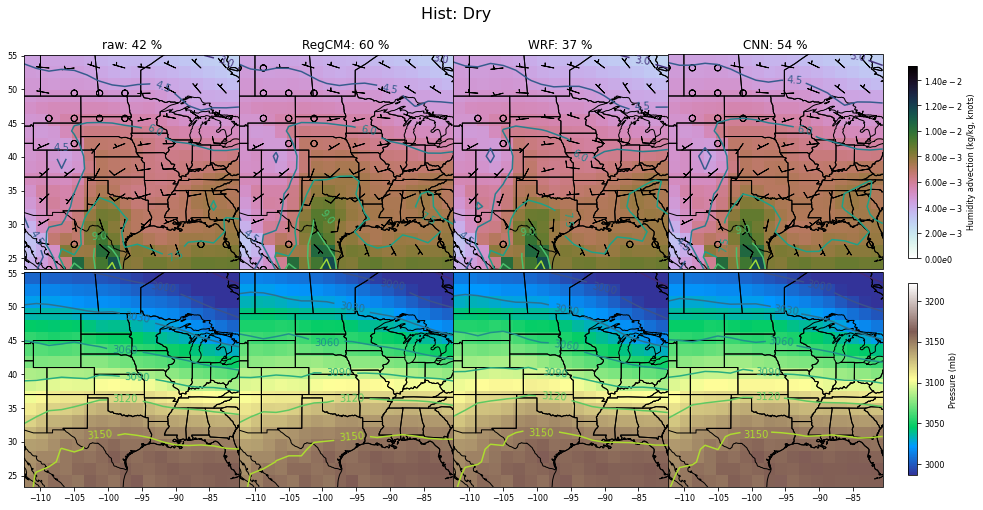

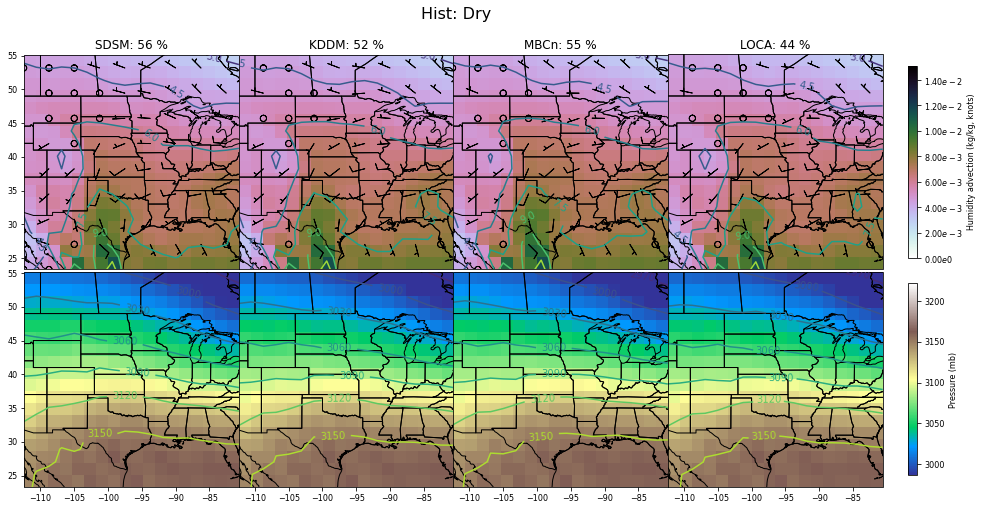

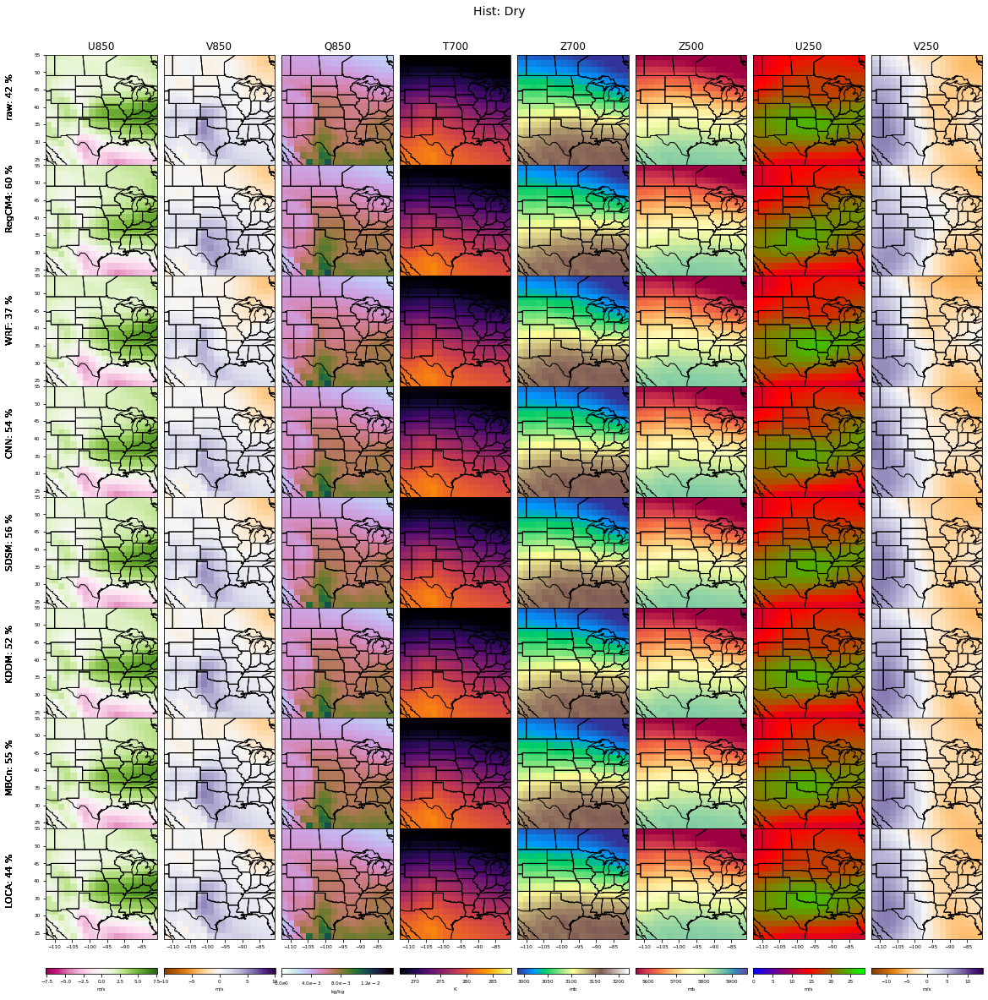

In [46]:
# plot Hist: dry
print("Hist DRY:")

sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
#sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_abs_postage2(sigfiles, vmin, vmax, 0, 0.254, 'Hist: Dry')   
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 0, 0.254, 'Hist: Dry')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 0, 0.254, 'Hist: Dry')     
plot_abs_postage(sigfiles, vmin, vmax, 0, 0.254, 'Hist: Dry')





Hist MOIST:


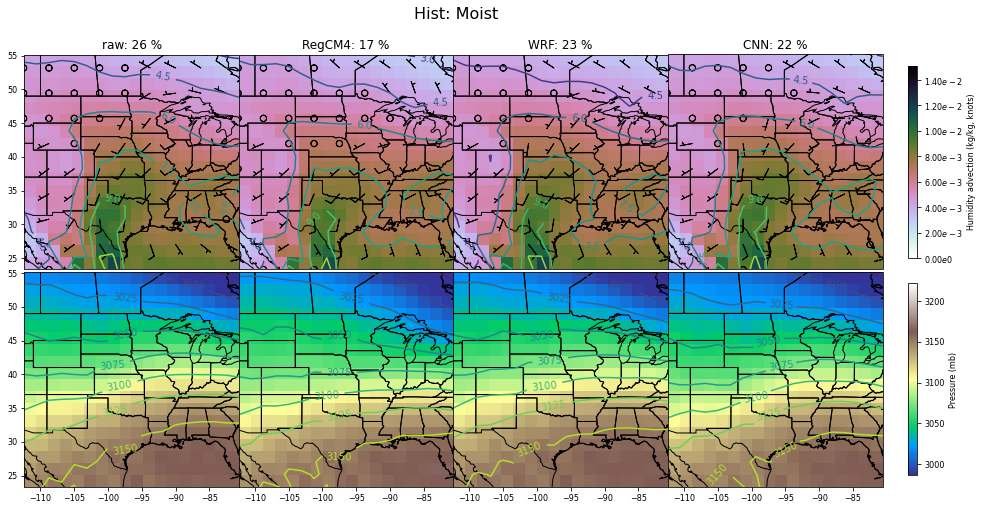

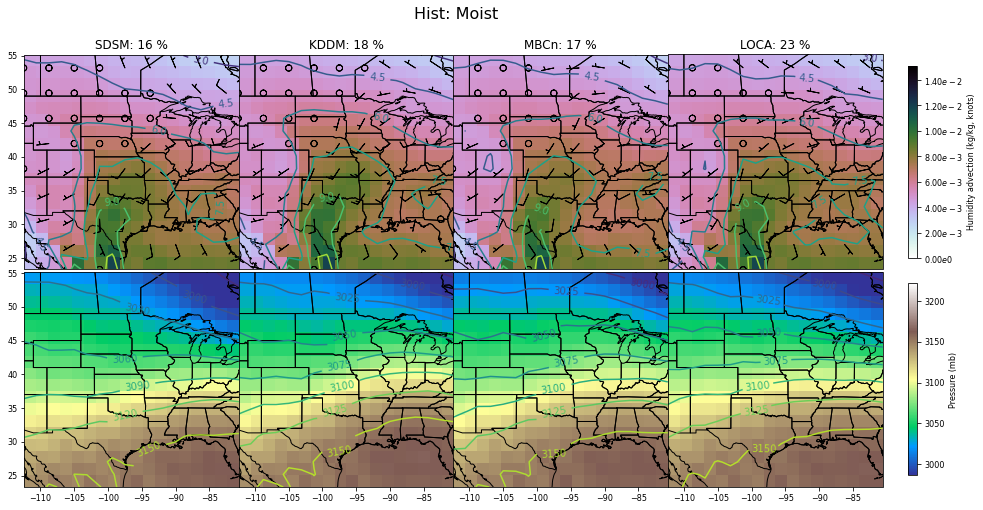

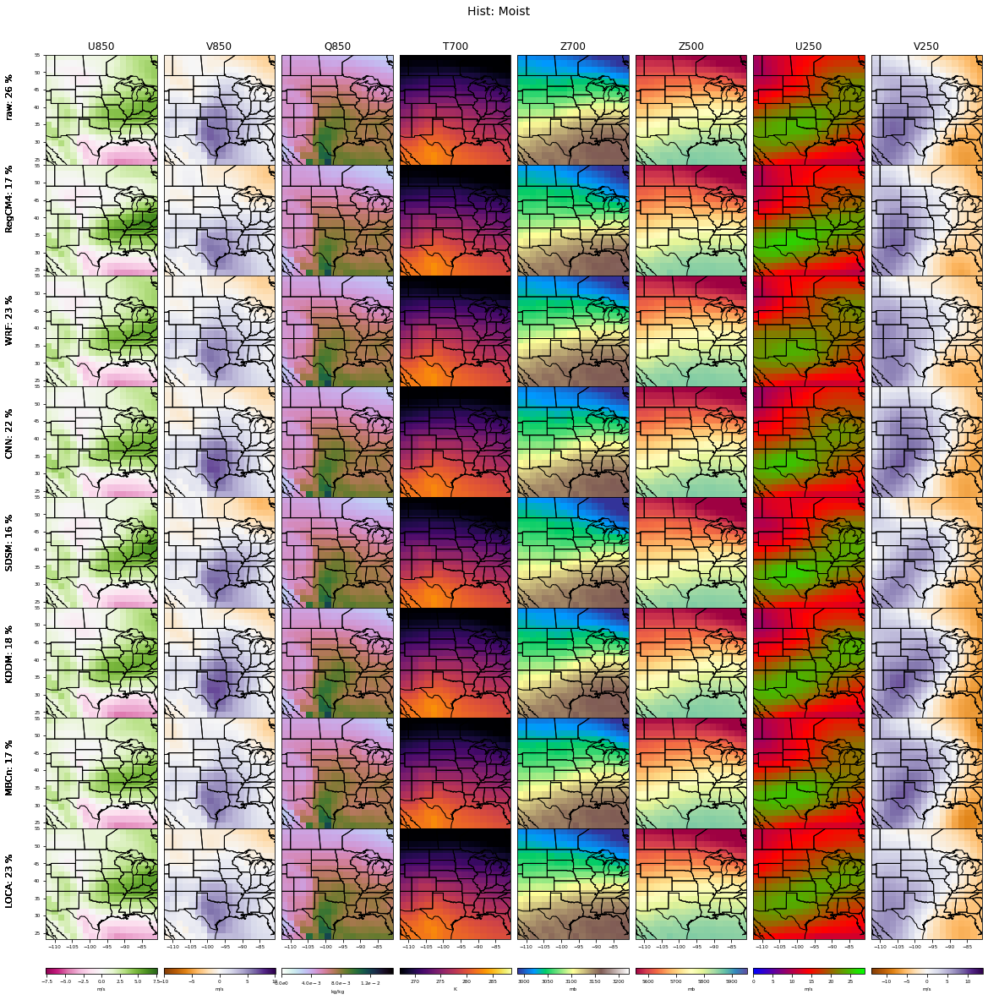

In [47]:
# plot Hist: Moist
print("Hist MOIST:")

sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
#sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_models(sigfiles_hist, vmin, vmax)
#plot_abs_postage2(sigfiles, vmin, vmax, 0.254, 3, 'Hist: Moist')    
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 0.254, 3, 'Hist: Moist')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 0.254, 3, 'Hist: Moist')     
plot_abs_postage(sigfiles, vmin, vmax, 0.254, 3, 'Hist: Moist')  



Hist WET:


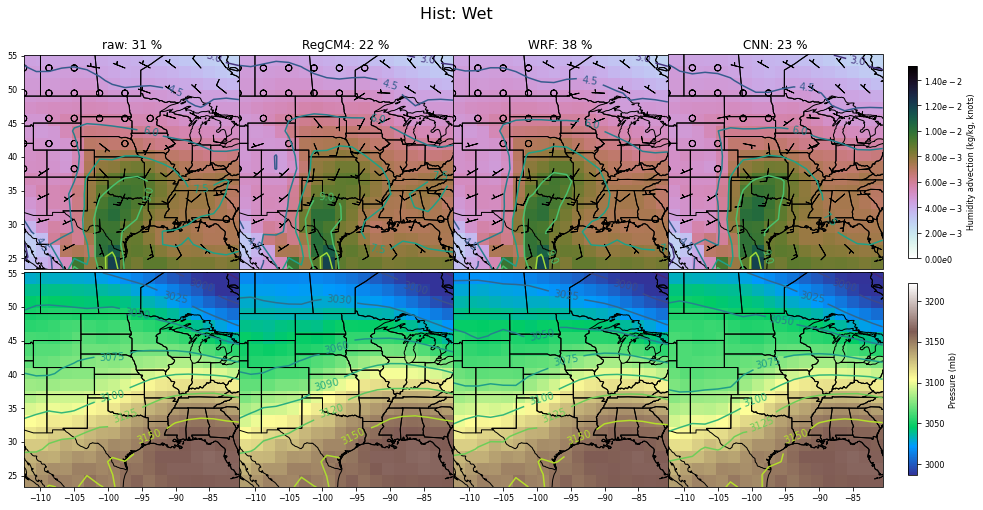

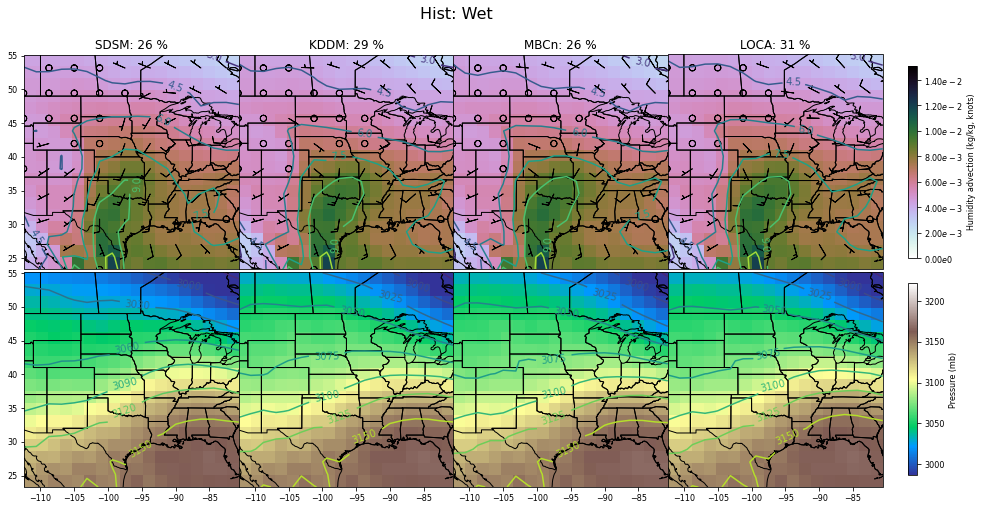

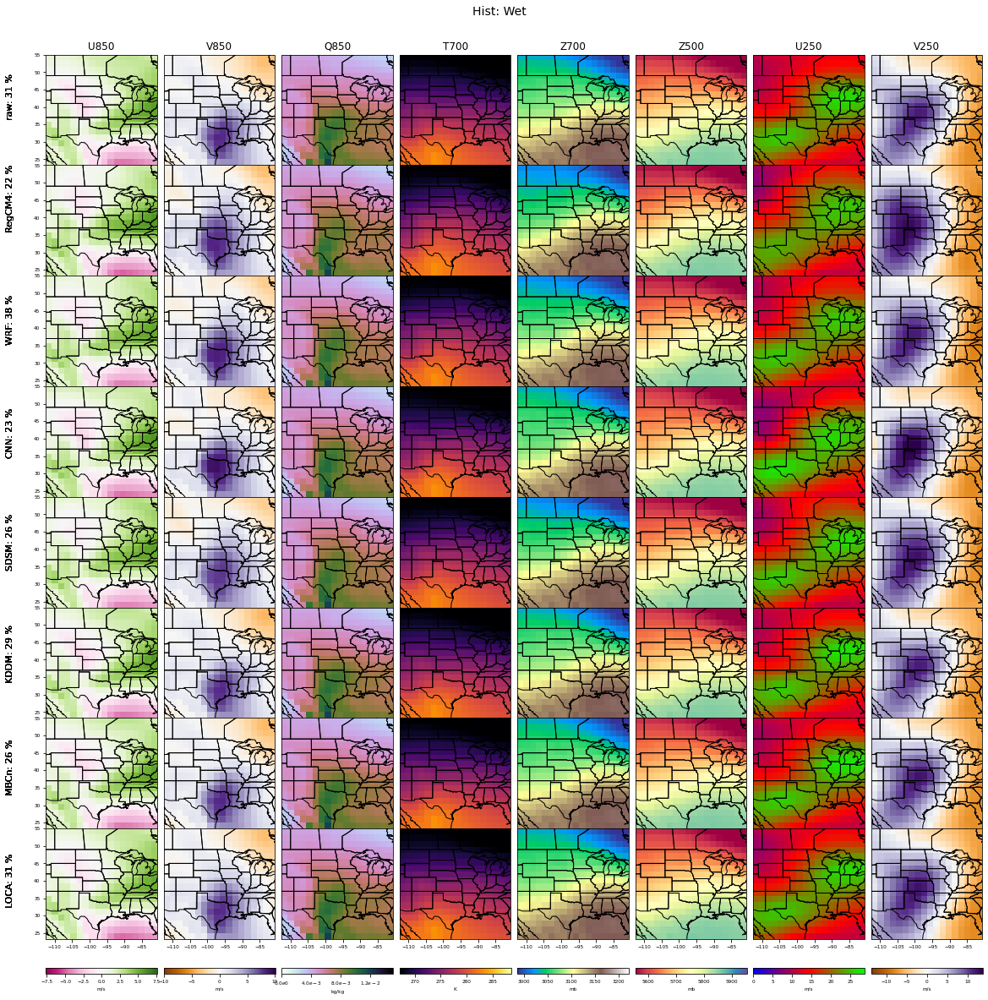

In [48]:
# plot Hist: Wet
print("Hist WET:")

sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
#sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_models(sigfiles_hist, vmin, vmax)
#plot_abs_postage2(sigfiles, vmin, vmax, 3., 9999, 'Hist: Wet') 
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 3., 9999, 'Hist: Wet')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 3., 9999, 'Hist: Wet')     
plot_abs_postage(sigfiles, vmin, vmax, 3., 9999, 'Hist: Wet')   



### Rcp85

In [49]:
## find max/min for each variable accross ALL hist files

# files to consider
#sigfiles_hist = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['obs','raw','RegCM4','WRF','MPAS','CNN','SDSM','KDDM','MBCn','LOCA']]
#sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]


# find min/max values for entire sigfiles set
vmin = 9999*np.ones(8) 
vmax = -9999*np.ones(8) 
for ii in range(len(sigfiles)):
    sigfile = sigfiles[ii]
                
    # load UATM and signal file contents
    if sigfile.lower().find('hist') >= 0: 
        load_uatm_mpi_hist()
    elif sigfile.lower().find('rcp85') >= 0: 
        load_uatm_mpi_future()
    else:
        print ("ERROR: neither hist or rcp85 found")
    rainsignal = xr.open_dataset(sigfile)['prec']

    for mpr_min, mpr_max in [(0,0.254), (0.254, 3.0), (3.0, 9999.0)]:
        avginput, count, distribution, indices = calc_uatm_average(mpr_min, mpr_max, rainsignal, -9999, 9999) 
 
        vmin = [min(avginput[ii].min(),vmin[ii]) for ii in range(8)]
        vmax = [max(avginput[ii].max(),vmax[ii]) for ii in range(8)]

In [50]:
# vmin = [-5.254681877164177, -3.3876612345377604, 0.003264548383603178, 267.02289592685986, 2986.3818474102736, 5554.487581623134, 8.374554520133156, -6.585132271902902]
# vmax = [7.652347383045015, 10.0453096703638, 0.015112950643300113, 288.6095920713608, 3221.7559111973023, 5953.858705357143, 28.817723630079584, 13.73383026681977]

In [51]:
print(vmin)
print(vmax)

[-5.254681877164177, -3.3876612345377604, 0.003264548383603178, 267.02289592685986, 2986.3818474102736, 5554.487581623134, 8.374554520133156, -6.585132271902902]
[7.652347383045015, 10.0453096703638, 0.015112950643300113, 288.6095920713608, 3221.7559111973023, 5953.858705357143, 28.817723630079584, 13.73383026681977]


Rcp85 DRY:


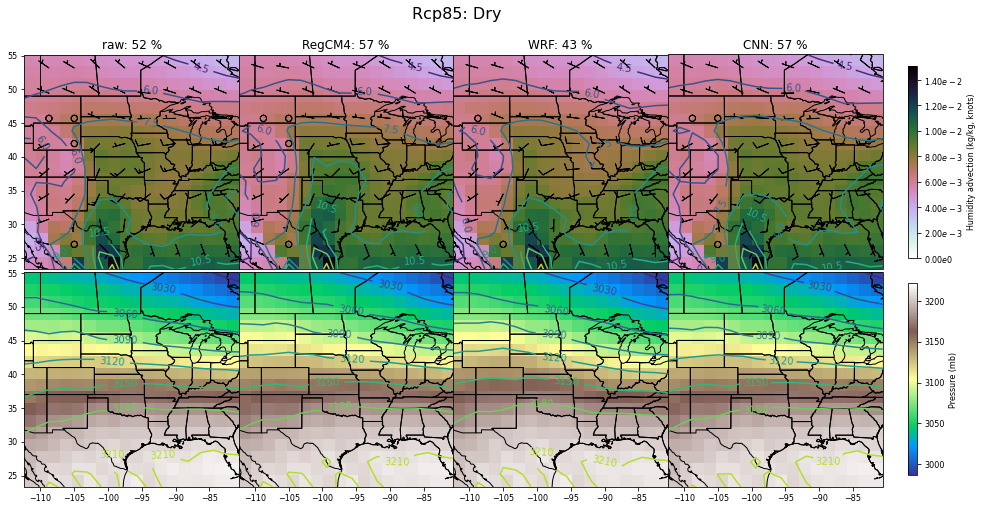

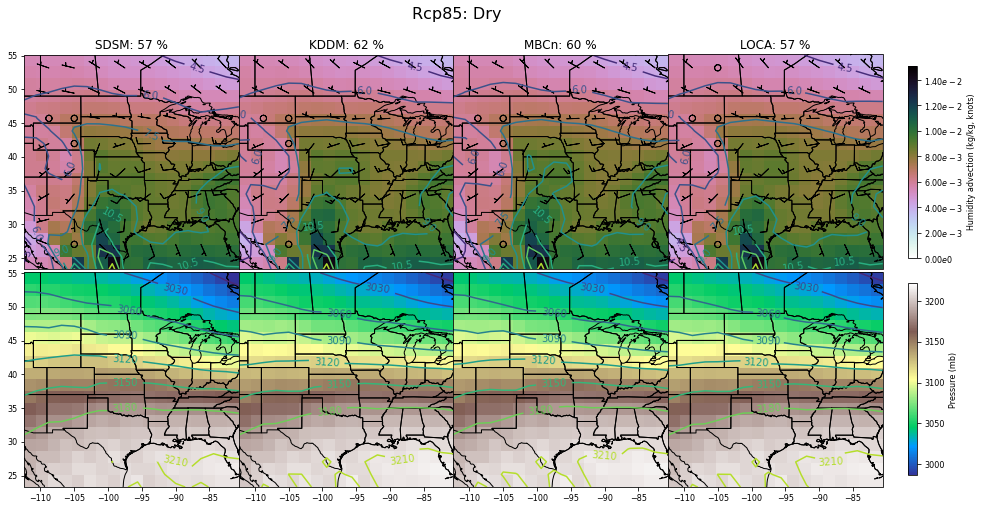

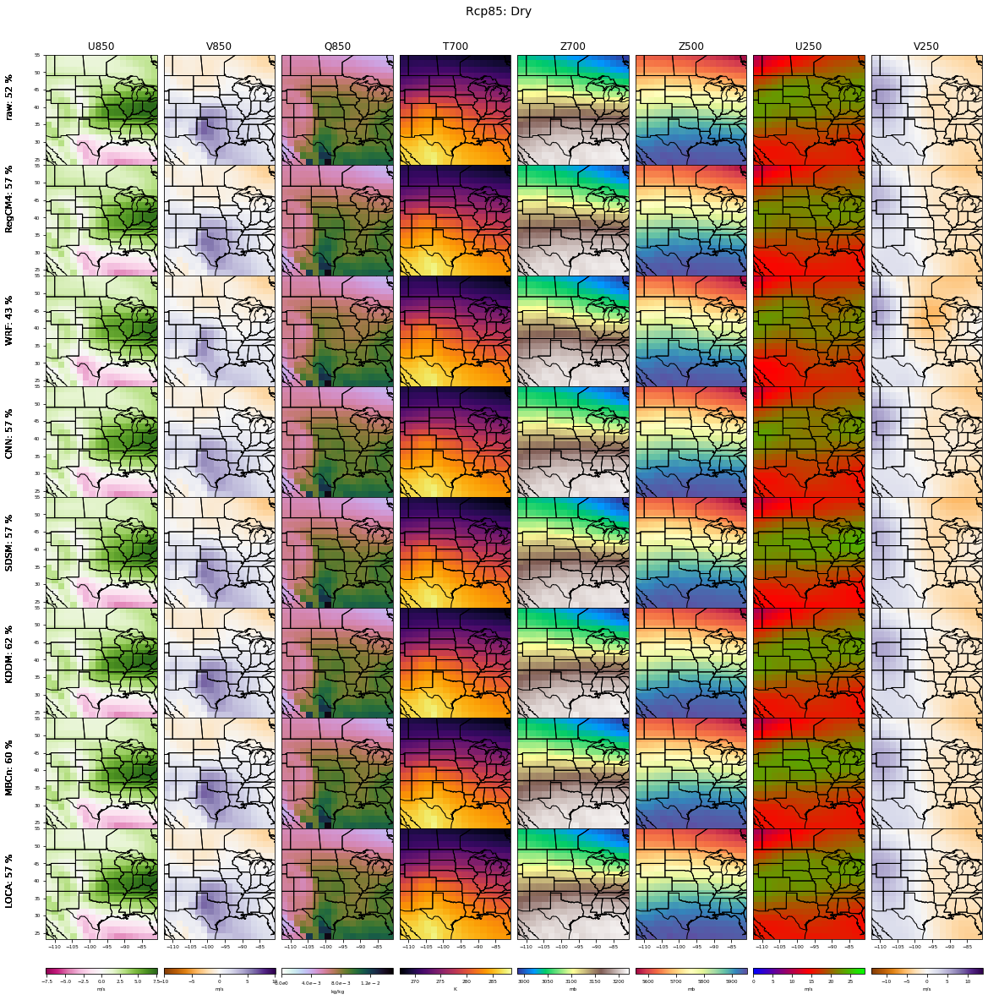

In [52]:
# plot Rcp85: dry
print("Rcp85 DRY:")

#sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_models(sigfiles_hist, vmin, vmax)
#plot_abs_postage2(sigfiles, vmin, vmax, 0, 0.254, 'Rcp85: Dry')     
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 0, 0.254, 'Rcp85: Dry')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 0, 0.254, 'Rcp85: Dry') 
plot_abs_postage(sigfiles, vmin, vmax, 0, 0.254, 'Rcp85: Dry') 




Rcp85 MOIST:


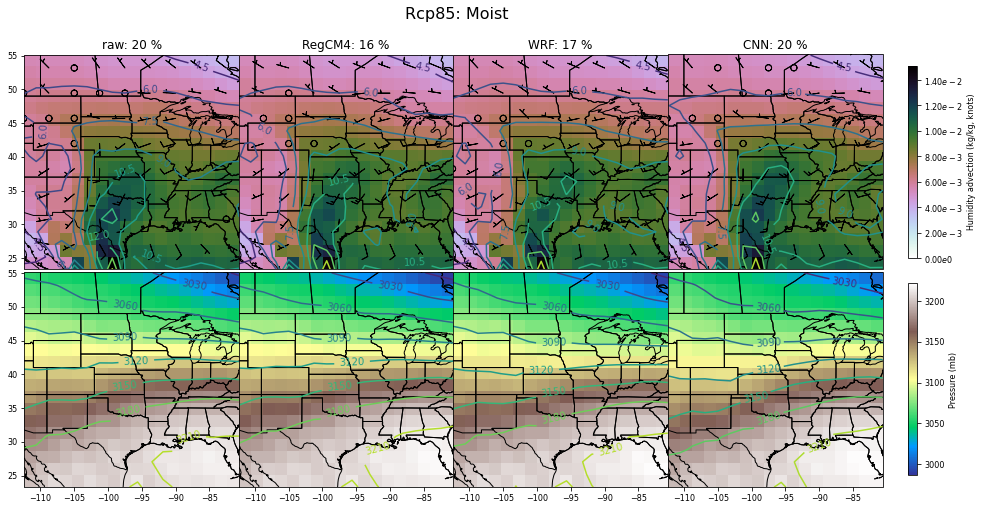

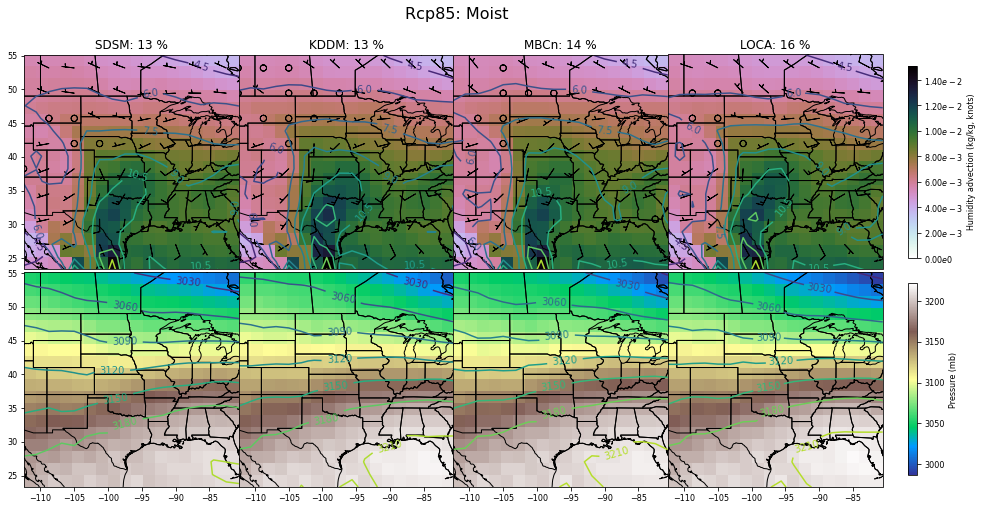

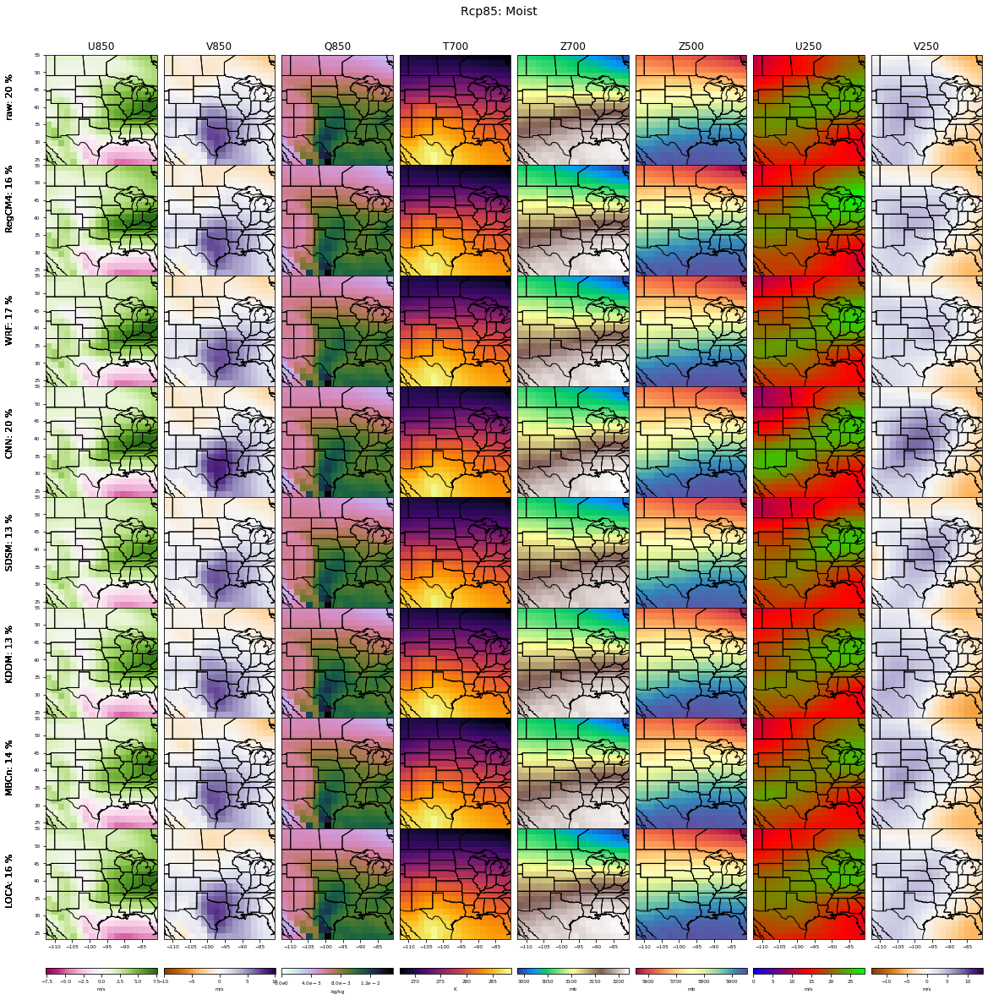

In [53]:
# plot Rcp85: Moist
print("Rcp85 MOIST:")

#sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_models(sigfiles_hist, vmin, vmax)
#plot_abs_postage2(sigfiles, vmin, vmax, 0.254, 3, 'Rcp85: Moist')  
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 0.254, 3, 'Rcp85: Moist')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 0.254, 3, 'Rcp85: Moist')     
plot_abs_postage(sigfiles, vmin, vmax, 0.254, 3, 'Rcp85: Moist') 



Rcp85 WET:


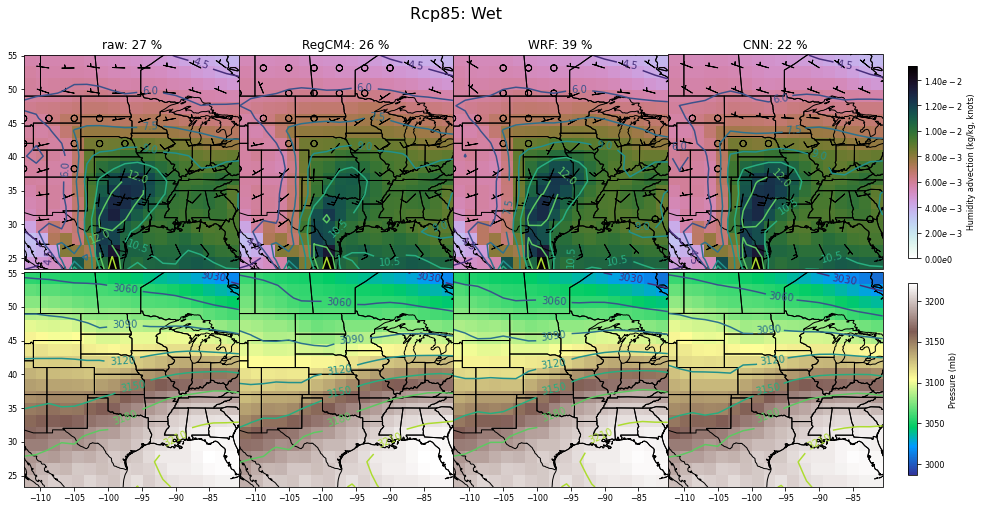

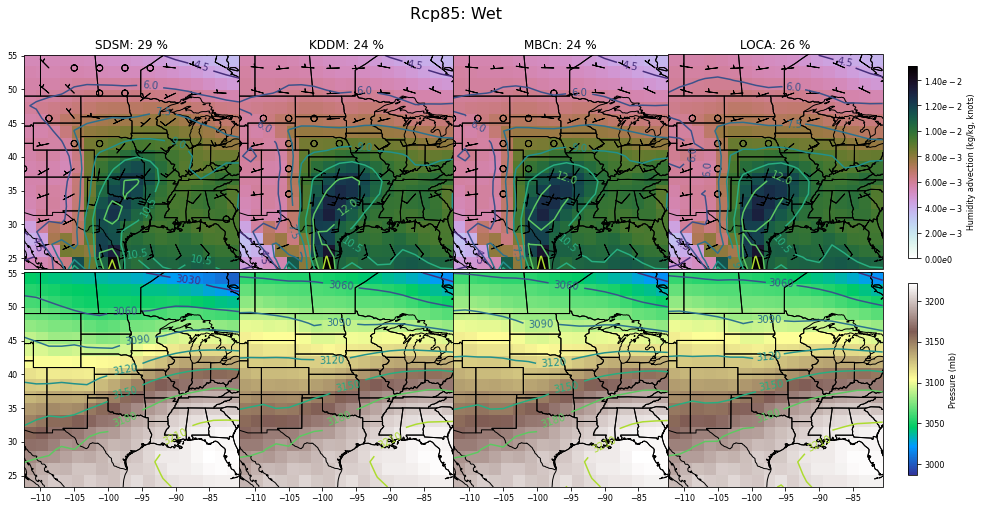

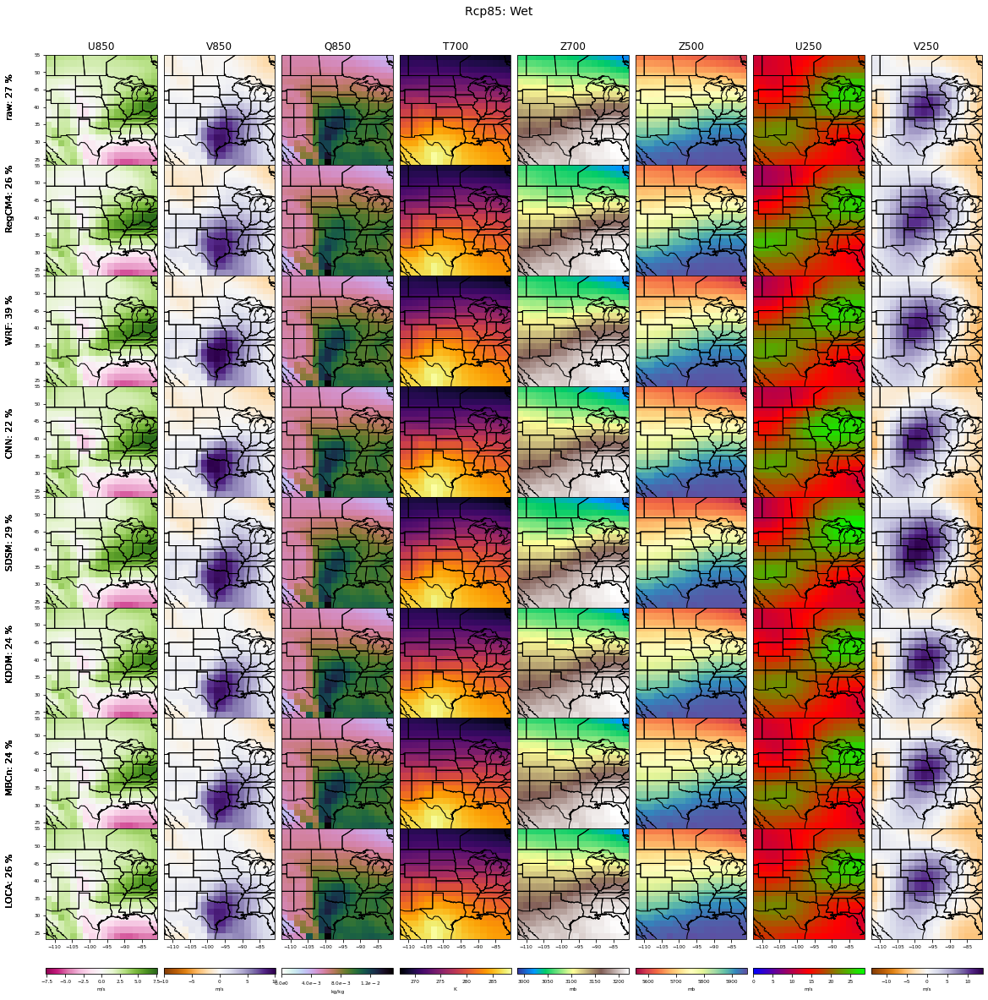

In [54]:
# plot Rcp85: Wet
print("Rcp85 WET:")

#sigfiles = [model2absfilepath(ff, 'hist', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]
sigfiles = [model2absfilepath(ff, 'rcp85', 98, 36) for ff in ['raw','RegCM4','WRF','CNN','SDSM','KDDM','MBCn','LOCA']]

#plot_models(sigfiles_hist, vmin, vmax)
#plot_abs_postage2(sigfiles, vmin, vmax, 3., 9999, 'Rcp85: Wet') 
plot_abs_postage4(sigfiles[0:4], vmin, vmax, 3., 9999, 'Rcp85: Wet')     
plot_abs_postage4(sigfiles[4:8], vmin, vmax, 3., 9999, 'Rcp85: Wet')     
plot_abs_postage(sigfiles, vmin, vmax, 3., 9999, 'Rcp85: Wet')  



In [28]:
2

2